# SD-Face-Editor Jupyter Notebook Demo

https://github.com/ototadana/sd-face-editor

## How it works
This script performs the following steps:

### Step 0
First, image(s) are generated as usual according to prompts and other settings. This script acts as a post-processor for those images.

### Step 1. Face Detection
Detects faces on the image.

### Step 2. Crop and Resize the Faces
Crop the detected face image and resize it to 512x512.

### Step 3. Recreate the Faces
Run img2img with the image to create a new face image.

### Step 4. Paste the Faces
Resize the new face image and paste it at the original image location.

### Step 5. Blend the entire image
To remove the borders generated when pasting the image, mask all but the face and run inpaint.

In [1]:
from typing import List

import torch
from face_editor.entities.rect import Landmarks, Point, Rect
from face_editor.use_cases.face_detector import FaceDetector
from facexlib.detection import init_detection_model, retinaface
from PIL import Image, ImageOps
import PIL
import numpy as np
import cv2

from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler, DDIMScheduler, ControlNetModel, StableDiffusionControlNetImg2ImgPipeline
from transformers import CLIPTextModel, CLIPTokenizer

In [2]:
device = "cuda"
seed = 1234

In [3]:
class Option:
    DEFAULT_FACE_MARGIN = 1.6
    DEFAULT_CONFIDENCE = 0.97
    DEFAULT_STRENGTH1 = 0.4
    DEFAULT_STRENGTH2 = 0.0
    DEFAULT_MAX_FACE_COUNT = 20
    DEFAULT_MASK_SIZE = 0
    DEFAULT_MASK_BLUR = 12
    DEFAULT_PROMPT_FOR_FACE = "hyperdetailed, masterpiece, top quality, best quality, official art, beautiful and aesthetic, colorful,highest detailed"
    DEFAULT_NEGATIVE_PROMPT_FOR_FACE = "bad_pictures,disfigured,lowres,cross-eyed,missing fingers,fused fingers,too many fingers,poorly drawn hands,malformed limbs,missing limb,mutated hands,ugly,long body,bad body,mutated,deformed,disconnected limbs,malformed hands,extra legs,bad feet,mutated hands and fingers,bad hands,extra limb,extra arms,floating limbs,poorly drawn face,skin blemishes,skin spots,mutation,long neck,mole,scar"
    DEFAULT_APPLY_INSIDE_MASK_ONLY = True
    DEFAULT_SAVE_ORIGINAL_IMAGE = False
    DEFAULT_SHOW_ORIGINAL_IMAGE = False
    DEFAULT_SHOW_INTERMEDIATE_STEPS = False
    DEFAULT_APPLY_SCRIPTS_TO_FACES = False
    DEFAULT_FACE_SIZE = 512
    DEFAULT_USE_MINIMAL_AREA = False
    DEFAULT_IGNORE_LARGER_FACES = True
    DEFAULT_AFFECTED_AREAS = ["Face"]
    # DEFAULT_WORKFLOW = open(os.path.join(workflows_dir, "default.json")).read()
    DEFAULT_UPSCALER = "None"
    DEFAULT_TILT_ADJUSTMENT_THRESHOLD = 40

    def __init__(self, *args) -> None:
        self.extra_options: Dict[str, Dict[str, str]] = {}
        self.face_margin = Option.DEFAULT_FACE_MARGIN
        self.confidence = Option.DEFAULT_CONFIDENCE
        self.strength1 = Option.DEFAULT_STRENGTH1
        self.strength2 = Option.DEFAULT_STRENGTH2
        self.max_face_count = Option.DEFAULT_MAX_FACE_COUNT
        self.mask_size = Option.DEFAULT_MASK_SIZE
        self.mask_blur = Option.DEFAULT_MASK_BLUR
        self.prompt_for_face = Option.DEFAULT_PROMPT_FOR_FACE
        self.negative_prompt_for_face = Option.DEFAULT_NEGATIVE_PROMPT_FOR_FACE
        self.apply_inside_mask_only = Option.DEFAULT_APPLY_INSIDE_MASK_ONLY
        self.save_original_image = Option.DEFAULT_SAVE_ORIGINAL_IMAGE
        self.show_intermediate_steps = Option.DEFAULT_SHOW_INTERMEDIATE_STEPS
        self.apply_scripts_to_faces = Option.DEFAULT_APPLY_SCRIPTS_TO_FACES
        self.face_size = Option.DEFAULT_FACE_SIZE
        self.use_minimal_area = Option.DEFAULT_USE_MINIMAL_AREA
        self.ignore_larger_faces = Option.DEFAULT_IGNORE_LARGER_FACES
        self.affected_areas = Option.DEFAULT_AFFECTED_AREAS
        self.show_original_image = Option.DEFAULT_SHOW_ORIGINAL_IMAGE
        # self.workflow = Option.DEFAULT_WORKFLOW
        self.upscaler = Option.DEFAULT_UPSCALER
        self.tilt_adjustment_threshold = Option.DEFAULT_TILT_ADJUSTMENT_THRESHOLD

        # if len(args) > 0 and isinstance(args[0], dict):
        #     self.update_by_dict(args[0])
        # else:
        #     self.update_by_list(args)

        self.apply_scripts_to_faces = False
        self.correct_tilt = False

        self.mask_round = True
option = Option()

In [4]:
def rotate_image(image: Image, angle: float) -> Image:
    if angle == 0:
        return image
    return Image.fromarray(rotate_array(np.array(image), angle))


def rotate_array(image: np.ndarray, angle: float) -> np.ndarray:
    if angle == 0:
        return image

    h, w = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(image, M, (w, h))

In [5]:
def correct_tilt_func(option: Option, angle: float) -> bool:
        if option.correct_tilt:
            return True
        angle = abs(angle)
        if angle > 180:
            angle = 360 - angle
        return angle > option.tilt_adjustment_threshold

In [6]:
def resize_image(resize_mode, im, width, height, upscaler_name=None):
    """
    Resizes an image with the specified resize_mode, width, and height.

    Args:
        resize_mode: The mode to use when resizing the image.
            0: Resize the image to the specified width and height.
            1: Resize the image to fill the specified width and height, maintaining the aspect ratio, and then center the image within the dimensions, cropping the excess.
            2: Resize the image to fit within the specified width and height, maintaining the aspect ratio, and then center the image within the dimensions, filling empty with data from image.
        im: The image to resize.
        width: The width to resize the image to.
        height: The height to resize the image to.
        upscaler_name: The name of the upscaler to use. If not provided, defaults to opts.upscaler_for_img2img.
    """

    # upscaler_name = upscaler_name or opts.upscaler_for_img2img

    # def resize(im, w, h):
    #     if upscaler_name is None or upscaler_name == "None" or im.mode == 'L':
    #         return im.resize((w, h), resample=LANCZOS)

    #     scale = max(w / im.width, h / im.height)

    #     if scale > 1.0:
    #         upscalers = [x for x in shared.sd_upscalers if x.name == upscaler_name]
    #         if len(upscalers) == 0:
    #             upscaler = shared.sd_upscalers[0]
    #             print(f"could not find upscaler named {upscaler_name or '<empty string>'}, using {upscaler.name} as a fallback")
    #         else:
    #             upscaler = upscalers[0]

    #         im = upscaler.scaler.upscale(im, scale, upscaler.data_path)

    #     if im.width != w or im.height != h:
    #         im = im.resize((w, h), resample=LANCZOS)

    #     return im

    def resize(im, w, h):
        return im.resize((w,h))

    if resize_mode == 0:
        res = resize(im, width, height)

    elif resize_mode == 1:
        ratio = width / height
        src_ratio = im.width / im.height

        src_w = width if ratio > src_ratio else im.width * height // im.height
        src_h = height if ratio <= src_ratio else im.height * width // im.width

        resized = resize(im, src_w, src_h)
        res = Image.new("RGB", (width, height))
        res.paste(resized, box=(width // 2 - src_w // 2, height // 2 - src_h // 2))

    else:
        ratio = width / height
        src_ratio = im.width / im.height

        src_w = width if ratio < src_ratio else im.width * height // im.height
        src_h = height if ratio >= src_ratio else im.height * width // im.width

        resized = resize(im, src_w, src_h)
        res = Image.new("RGB", (width, height))
        res.paste(resized, box=(width // 2 - src_w // 2, height // 2 - src_h // 2))

        if ratio < src_ratio:
            fill_height = height // 2 - src_h // 2
            if fill_height > 0:
                res.paste(resized.resize((width, fill_height), box=(0, 0, width, 0)), box=(0, 0))
                res.paste(resized.resize((width, fill_height), box=(0, resized.height, width, resized.height)), box=(0, fill_height + src_h))
        elif ratio > src_ratio:
            fill_width = width // 2 - src_w // 2
            if fill_width > 0:
                res.paste(resized.resize((fill_width, height), box=(0, 0, 0, height)), box=(0, 0))
                res.paste(resized.resize((fill_width, height), box=(resized.width, 0, resized.width, height)), box=(fill_width + src_w, 0))

    return res

In [7]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Step 0 Load the initial image

In [13]:
import os
outdir = "demo_images"
os.makedirs(outdir, exist_ok=True)

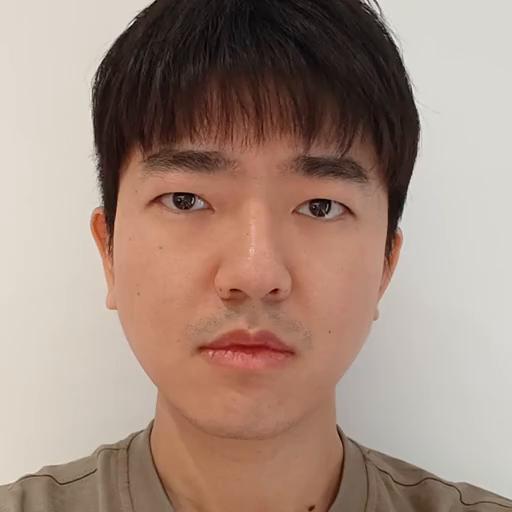

In [15]:
# read image prompt (face, here we use a ai-generation face)
dataroot = "/ssddata/liuyue/github"
# image = Image.open(f"{dataroot}/girl2.png")
# image = Image.open(f"/export/project/liuyue/video-dataset/frames/000.mp4/0.jpg")
# image = Image.open(f"/ssddata/liuyue/github/jiawei_video/input_videos-1/happy/image/1.png")
dataroot = "/ssddata/liuyue/github/jiawei_video/input_videos-1"
mood1, mood2 = "happy", "happy"
imageid1, imageid2 = 1, 50
image = Image.open(f"{dataroot}/{mood1}/image/{imageid1}.png")

# image.resize((256, 256))
image0 = image.copy()
imagenp = np.array(image)
image.save(f"{outdir}/{mood1}_{mood2}_input_{imageid1}_{imageid2}.png")
image

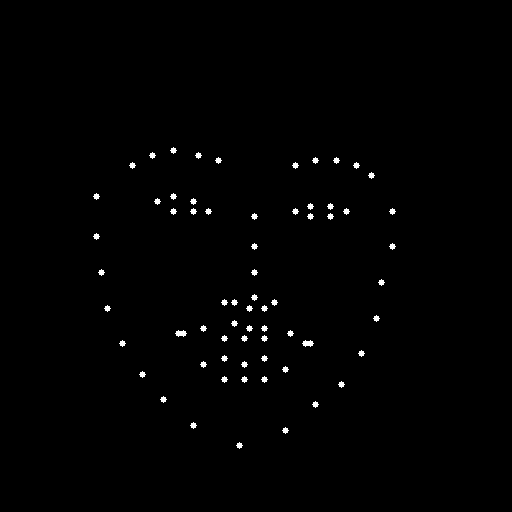

In [16]:
# read image prompt (face, here we use a ai-generation face)
dataroot = "/ssddata/liuyue/github"
# image = Image.open(f"{dataroot}/girl2.png")
# image = Image.open(f"/export/project/liuyue/video-dataset/frames/000.mp4/0.jpg")
# image = Image.open(f"/ssddata/liuyue/github/jiawei_video/input_videos-1/happy/image/1.png")
dataroot = "/ssddata/liuyue/github/jiawei_video/input_videos-1"
cond_image = Image.open(f"{dataroot}/{mood2}/keypoints_images/{imageid2}_keypoint.png")

# image.resize((256, 256))
cond_image0 = cond_image.copy()
cond_imagenp = np.array(cond_image)
landmark_img = cond_image
image.save(f"{outdir}/{mood1}_{mood2}_landmark_{imageid1}_{imageid2}.png")
cond_image

In [17]:
import einops
def HWC3(x):
    assert x.dtype == np.uint8
    if x.ndim == 2:
        x = x[:, :, None]
    assert x.ndim == 3
    H, W, C = x.shape
    assert C == 1 or C == 3 or C == 4
    if C == 3:
        return x
    if C == 1:
        return np.concatenate([x, x, x], axis=2)
    if C == 4:
        color = x[:, :, 0:3].astype(np.float32)
        alpha = x[:, :, 3:4].astype(np.float32) / 255.0
        y = color * alpha + 255.0 * (1.0 - alpha)
        y = y.clip(0, 255).astype(np.uint8)
        return y
detected_map = HWC3(np.array(landmark_img))
control = torch.from_numpy(detected_map.copy()).float().cuda() / 255.0
control = torch.stack([control for _ in range(1)], dim=0)
control = einops.rearrange(control, 'b h w c -> b c h w').clone()
control

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], device='cuda:0')

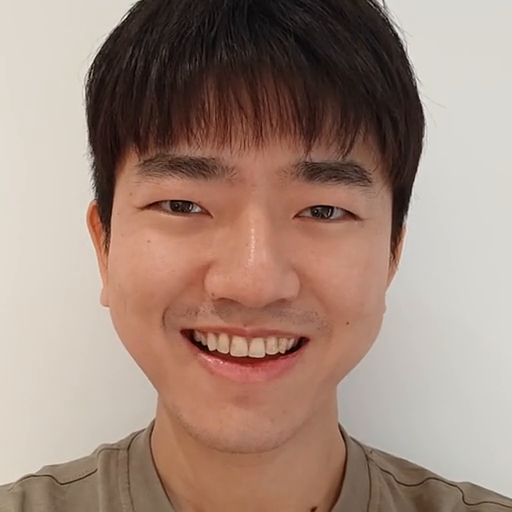

In [18]:
# read image prompt (face, here we use a ai-generation face)
dataroot = "/ssddata/liuyue/github"
# image = Image.open(f"{dataroot}/girl2.png")
# image = Image.open(f"/export/project/liuyue/video-dataset/frames/000.mp4/0.jpg")
# image = Image.open(f"/ssddata/liuyue/github/jiawei_video/input_videos-1/happy/image/1.png")
dataroot = "/ssddata/liuyue/github/jiawei_video/input_videos-1"
target_image = Image.open(f"{dataroot}/{mood2}/image/{imageid2}.png")

# image.resize((256, 256))
target_image0 = target_image.copy()
target_imagenp = np.array(target_image)
image.save(f"{outdir}/{mood1}_{mood2}_target_{imageid1}_{imageid2}.png")
target_image

## Step 1 Detect a face and crop the face image

In [19]:
# from face_editor.entities.option import Option
from face_editor.entities.rect import Point, Rect
class Face:
    def __init__(self, entire_image: np.ndarray, face_area: Rect, face_margin: float, face_size: int, upscaler: str):
        self.face_area = face_area
        self.center = face_area.center
        left, top, right, bottom = face_area.to_square()
        self.left, self.top, self.right, self.bottom = self.__ensure_margin(
            left, top, right, bottom, entire_image, face_margin
        )

        self.width = self.right - self.left
        self.height = self.bottom - self.top

        self.image = self.__crop_face_image(entire_image, face_size, upscaler)
        self.face_size = face_size
        self.scale_factor = face_size / self.width
        self.face_area_on_image = self.__get_face_area_on_image()
        self.landmarks_on_image = self.__get_landmarks_on_image()

    def __get_face_area_on_image(self):
        left = int((self.face_area.left - self.left) * self.scale_factor)
        top = int((self.face_area.top - self.top) * self.scale_factor)
        right = int((self.face_area.right - self.left) * self.scale_factor)
        bottom = int((self.face_area.bottom - self.top) * self.scale_factor)
        return self.__clip_values(left, top, right, bottom)

    def __get_landmarks_on_image(self):
        landmarks = []
        if self.face_area.landmarks is not None:
            for landmark in self.face_area.landmarks:
                landmarks.append(
                    Point(
                        int((landmark.x - self.left) * self.scale_factor),
                        int((landmark.y - self.top) * self.scale_factor),
                    )
                )
        return landmarks

    def __crop_face_image(self, entire_image: np.ndarray, face_size: int, upscaler: str):
        cropped = entire_image[self.top : self.bottom, self.left : self.right, :]
        if upscaler and upscaler != Option.DEFAULT_UPSCALER:
            return images.resize_image(0, Image.fromarray(cropped), face_size, face_size, upscaler)
        else:
            return Image.fromarray(cv2.resize(cropped, dsize=(face_size, face_size)))

    def __ensure_margin(self, left: int, top: int, right: int, bottom: int, entire_image: np.ndarray, margin: float):
        entire_height, entire_width = entire_image.shape[:2]

        side_length = right - left
        margin = min(min(entire_height, entire_width) / side_length, margin)
        diff = int((side_length * margin - side_length) / 2)

        top = top - diff
        bottom = bottom + diff
        left = left - diff
        right = right + diff

        if top < 0:
            bottom = bottom - top
            top = 0
        if left < 0:
            right = right - left
            left = 0

        if bottom > entire_height:
            top = top - (bottom - entire_height)
            bottom = entire_height
        if right > entire_width:
            left = left - (right - entire_width)
            right = entire_width

        return left, top, right, bottom

    def get_angle(self) -> float:
        landmarks = getattr(self.face_area, "landmarks", None)
        if landmarks is None:
            return 0

        eye1 = getattr(landmarks, "eye1", None)
        eye2 = getattr(landmarks, "eye2", None)
        if eye2 is None or eye1 is None:
            return 0

        try:
            dx = eye2.x - eye1.x
            dy = eye2.y - eye1.y
            if dx == 0:
                dx = 1
            angle = np.arctan(dy / dx) * 180 / np.pi

            if dx < 0:
                angle = (angle + 180) % 360
            return angle
        except Exception:
            print(traceback.format_exc())
            return 0

    def rotate_face_area_on_image(self, angle: float):
        center = [
            (self.face_area_on_image[0] + self.face_area_on_image[2]) / 2,
            (self.face_area_on_image[1] + self.face_area_on_image[3]) / 2,
        ]

        points = [
            [self.face_area_on_image[0], self.face_area_on_image[1]],
            [self.face_area_on_image[2], self.face_area_on_image[3]],
        ]

        angle = np.radians(angle)
        rot_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])

        points = np.array(points) - center
        points = np.dot(points, rot_matrix.T)
        points += center
        left, top, right, bottom = (int(points[0][0]), int(points[0][1]), int(points[1][0]), int(points[1][1]))

        left, right = (right, left) if left > right else (left, right)
        top, bottom = (bottom, top) if top > bottom else (top, bottom)

        width, height = right - left, bottom - top
        if width < height:
            left, right = left - (height - width) // 2, right + (height - width) // 2
        elif height < width:
            top, bottom = top - (width - height) // 2, bottom + (width - height) // 2
        return self.__clip_values(left, top, right, bottom)

    def __clip_values(self, *args):
        result = []
        for val in args:
            if val < 0:
                result.append(0)
            elif val > self.face_size:
                result.append(self.face_size)
            else:
                result.append(val)
        return tuple(result)


In [20]:
class RetinafaceDetector(FaceDetector):
    def __init__(self) -> None:
        self.detection_model = init_detection_model("retinaface_resnet50", device=device)

    def name(self):
        return "RetinaFace"

    def detect_faces(self, image: Image, confidence: float, **kwargs) -> List[Rect]:
        with torch.no_grad():
            boxes_landmarks = self.detection_model.detect_faces(image, confidence)

        faces = []
        for box_landmark in boxes_landmarks:  
            print(box_landmark)
            
            face_box = box_landmark[:5] # left, top, right, bottom, *_
            landmark = box_landmark[5:]

            face = Rect.from_ndarray(face_box)

            eye1 = Point(int(landmark[0]), int(landmark[1]))
            eye2 = Point(int(landmark[2]), int(landmark[3]))
            nose = Point(int(landmark[4]), int(landmark[5]))
            mouth2 = Point(int(landmark[6]), int(landmark[7]))
            mouth1 = Point(int(landmark[8]), int(landmark[9]))

            face.landmarks = Landmarks(eye1, eye2, nose, mouth1, mouth2)
            faces.append(face)

        return faces

In [21]:
retinaFaceDetector = RetinafaceDetector()

/ssddata/liuyue/miniconda3/envs/diffusers/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/ssddata/liuyue/miniconda3/envs/diffusers/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [22]:
faces_raw = retinaFaceDetector.detect_faces(image, 0.9)

[118.45329    87.91875   379.99738   435.15247     0.9998281 186.45285
 202.72142   317.38425   206.52501   254.65402   284.9229    199.8209
 348.3644    296.23288   351.42108  ]


In [23]:
face_raw = faces_raw[0]

In [24]:
face_raw.landmarks

Landmarks(eye1=Point(x=186, y=202), eye2=Point(x=317, y=206), nose=Point(x=254, y=284), mouth1=Point(x=296, y=351), mouth2=Point(x=199, y=348))

In [25]:
print(face_raw.left, face_raw.top, face_raw.right, face_raw.bottom)

118 87 379 435


In [26]:
face_area = faces_raw[0]
face = Face(np.array(image), face_area, option.face_margin, option.face_size, option.upscaler)

In [27]:
face.face_area_on_image

(118, 87, 379, 435)

In [28]:
face.landmarks_on_image

[Point(x=186, y=202),
 Point(x=317, y=206),
 Point(x=254, y=284),
 Point(x=296, y=351),
 Point(x=199, y=348)]

In [29]:
from PIL import Image, ImageDraw

In [30]:
def draw_box(image, x1, y1, x2, y2):
    draw = ImageDraw.Draw(image)
    draw.rectangle([x1,y1,x2,y2], fill=None, outline="purple", width=5)
def draw_box_area(image, face_area):
    draw = ImageDraw.Draw(image)
    draw.rectangle(face_area, fill=None, outline="purple", width=5)

In [31]:
image_box = face.image.copy()
draw_box_area(image_box, face.face_area_on_image)

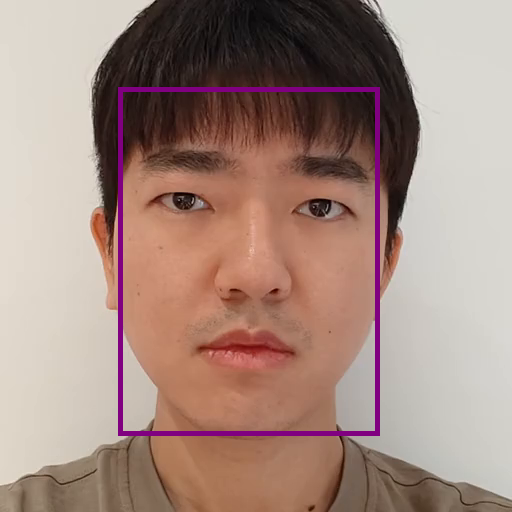

In [32]:
image_box

In [33]:
def draw_keypoints(image, points, radius=10):
    """
    points = [(x1,y1),(x2,y2),...]
    """
    draw = ImageDraw.Draw(image)

    for pt in points:
        x, y = pt
        draw.ellipse((x-radius, y-radius, x+radius, y+radius), fill="purple")

In [34]:
image_kps = face.image.copy()
draw_keypoints(image_kps, face.landmarks_on_image)

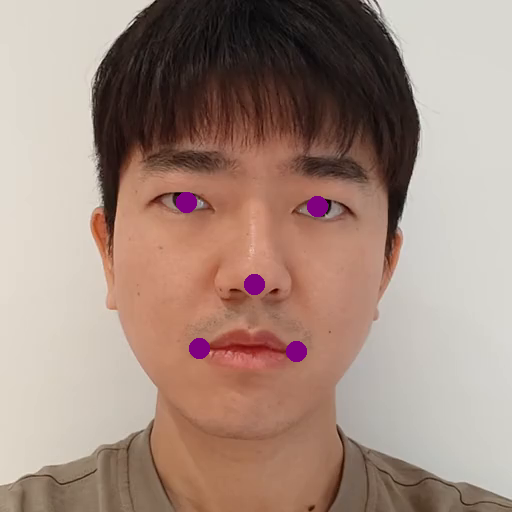

In [35]:
image_kps

In [36]:
face_image = face.image

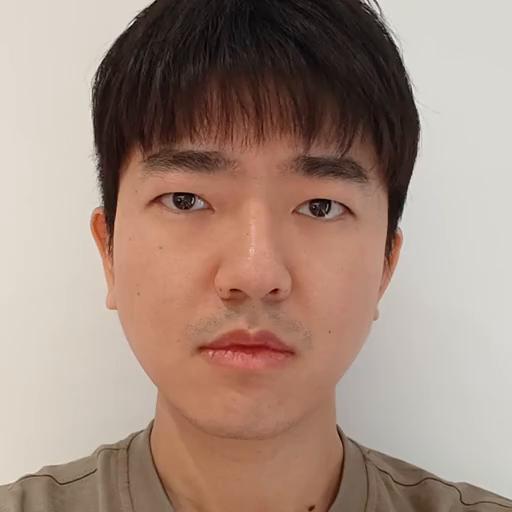

In [37]:
face_image

In [38]:
face_imagenp = np.array(face_image)

## Step 2

In [31]:
# from torchvision import transforms
# resolution=512
# image_transforms = transforms.Compose(
#         [
#             transforms.Resize(resolution, interpolation=transforms.InterpolationMode.BILINEAR),
#             transforms.CenterCrop(resolution),
#         ]
#     )

In [32]:
# face_image_resized = image_transforms(face_image)
# face_image_resized

1.7489460445542306


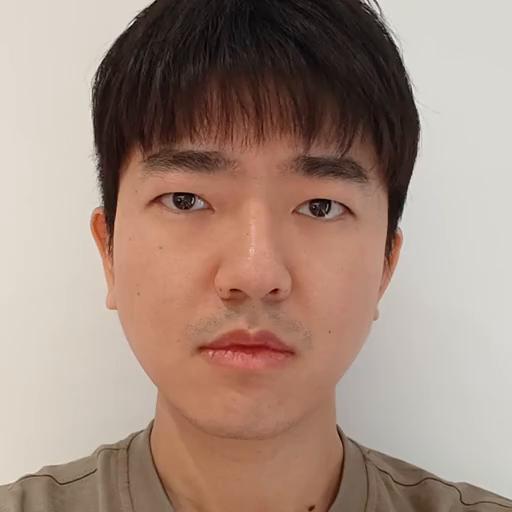

In [33]:
angle = face.get_angle()
print(angle)
correct_tilt = correct_tilt_func(option, angle)
face.image = rotate_image(face.image, angle) if correct_tilt else face.image
face.image

## Step 3

In [34]:
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline, StableDiffusionInpaintPipeline, StableDiffusionInpaintPipelineLegacy, DDIMScheduler, AutoencoderKL, EulerAncestralDiscreteScheduler
from PIL import Image

from ip_adapter import IPAdapterFull

In [35]:
base_model_path = "SG161222/Realistic_Vision_V4.0_noVAE"
# base_model_path = "/ssddata/liuyue/github/stable-diffusion-webui/stable-diffusion-webui/models/Stable-diffusion/awportrait_v13.safetensors"
vae_model_path = "stabilityai/sd-vae-ft-mse"
image_encoder_path = "../IP-Adapter/models/image_encoder/"
ip_ckpt = "../IP-Adapter/models/ip-adapter-full-face_sd15.bin"
device = "cuda"

In [309]:


noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False,
    set_alpha_to_one=False,
    steps_offset=1,
)

# noise_scheduler = EulerAncestralDiscreteScheduler(
#     num_train_timesteps=1000,
#     beta_start=0.00085,
#     beta_end=0.012,
#     beta_schedule="scaled_linear",


# )

vae = AutoencoderKL.from_pretrained(vae_model_path).to(dtype=torch.float16)

NameError: name 'vae_model_path' is not defined

In [37]:
# load SD pipeline
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    scheduler=noise_scheduler,
    vae=vae,
    feature_extractor=None,
    safety_checker=None
)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [38]:
# load ip-adapter
# we use 256 patch tokens and 1 cls token
ip_model = IPAdapterFull(pipe, image_encoder_path, ip_ckpt, device, num_tokens=257)

/ssddata/liuyue/github/diffusers/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:750: FutureWarning: You have passed 4 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/40 [00:00<?, ?it/s]

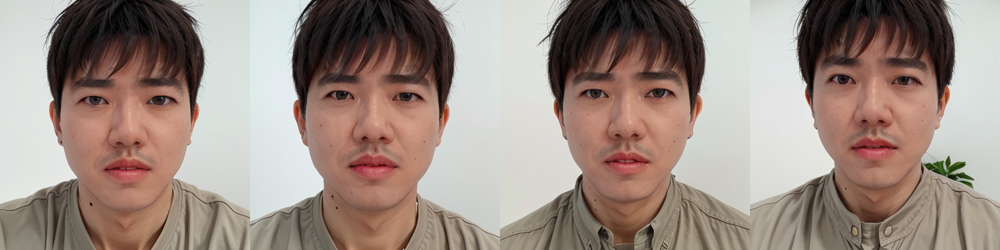

In [39]:
# use face as image prompt

images = ip_model.generate(
    pil_image=face_image, num_samples=4, prompt="laughing with mouth open, very happily, " + option.prompt_for_face, image=face_image, 
    negative_prompt=option.negative_prompt_for_face,
    scale=0.7, width=512, height=512, num_inference_steps=50, seed=seed)
grid = image_grid(images, 1, 4)
grid

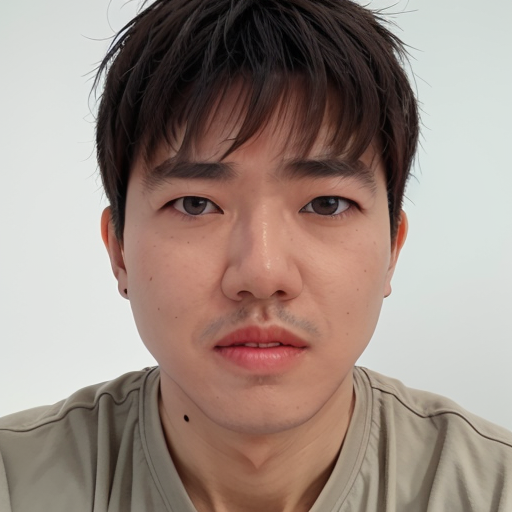

In [40]:
edited_face_image = images[0]
edited_face_image

In [41]:
edited_face_imagenp = np.array(edited_face_image)

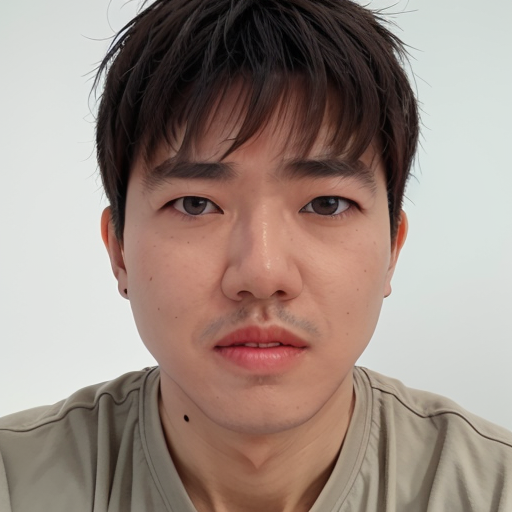

In [42]:
face.image = rotate_image(edited_face_image, -angle) if correct_tilt else edited_face_image
face.image

In [108]:
face_controlnet_path = "/ssddata/liuyue/github/Face-Landmark-ControlNet/models_for_diffusers"
controlnet = ControlNetModel.from_pretrained(f"{face_controlnet_path}").to(dtype=torch.float16)

In [109]:
pipeline = StableDiffusionControlNetImg2ImgPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    scheduler=noise_scheduler,
    vae=vae,
    feature_extractor=None,
    safety_checker=None,
    controlnet = controlnet,
).to(device)

NameError: name 'base_model_path' is not defined

In [ ]:
# NOT use ip-adapter to keep faceid
images = pipeline(
    prompt=[option.prompt_for_face]*4, image=face_image,
    negative_prompt=[option.negative_prompt_for_face]*4, 
    scale=0.7, width=512, height=512, num_inference_steps=30, seed=seed, 
    control_image = control,
    # controlnet_conditioning_scale = 1.0,
).images
grid = image_grid(images, 1, len(images))
grid

In [ ]:
# load ip-adapter
# we use 256 patch tokens and 1 cls token
ip_model = IPAdapterFull(pipeline, image_encoder_path, ip_ckpt, device, num_tokens=257)

In [ ]:
# use face as image prompt
images = ip_model.generate(
    pil_image=face_image, num_samples=4, prompt=option.prompt_for_face, image=face_image, 
    negative_prompt = option.negative_prompt_for_face,
    scale=0.7, width=512, height=512, num_inference_steps=50, seed=seed, 
    control_image = control,
    controlnet_conditioning_scale = 1.2,
)
grid = image_grid(images, 1, 4)
grid

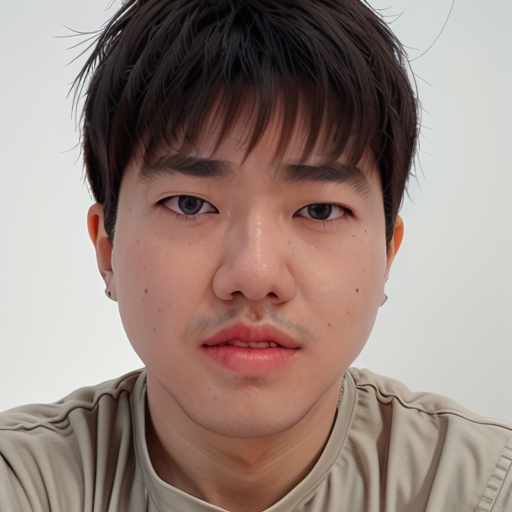

In [48]:
edited_face_image = images[0]
edited_face_image

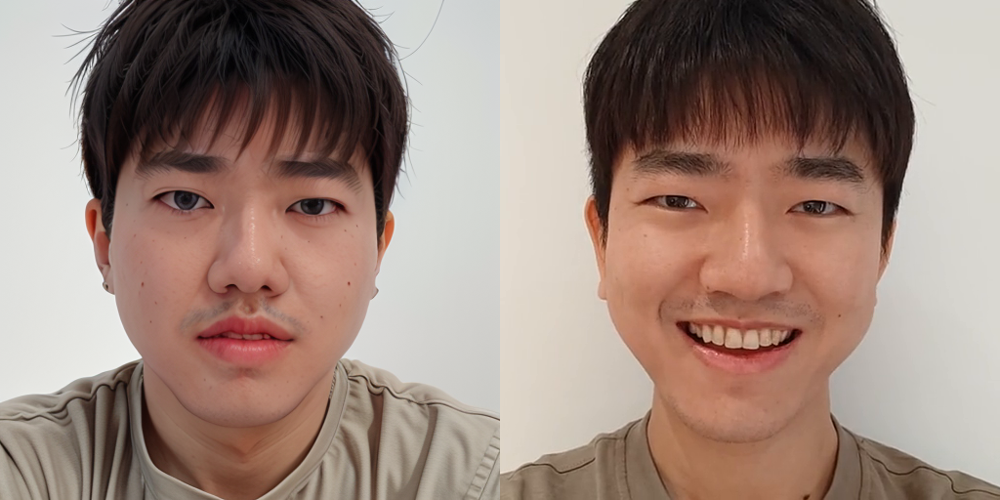

In [49]:
image_grid([edited_face_image, target_image], 1, 2)

In [50]:
edited_face_imagenp = np.array(edited_face_image)

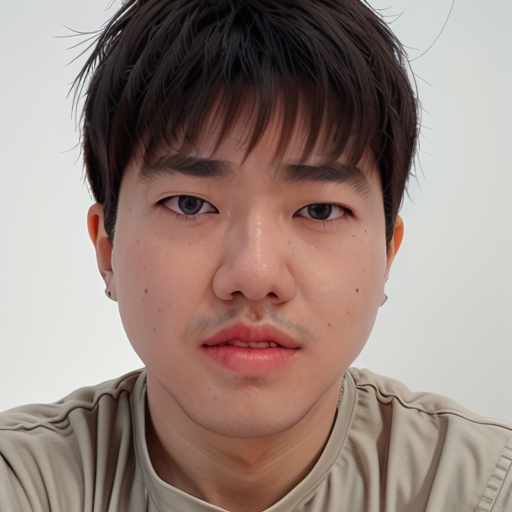

In [51]:
face.image = rotate_image(edited_face_image, -angle) if correct_tilt else edited_face_image
face.image

## Step 3.1 InstantID + Landmark Controlnet

In [121]:
from InstantID.pipeline_stable_diffusion_xl_instantid_img2img import StableDiffusionXLInstantIDImg2ImgPipeline
import torch

In [122]:
dtype= torch.float16
device = "cuda"

In [123]:
from insightface.app import FaceAnalysis
# Load face encoder
app = FaceAnalysis(name='antelopev2', root='InstantID/', providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640), det_thresh=0.1)

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: InstantID/models/antelopev2/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: InstantID/models/antelopev2/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: InstantID/models/antelopev2/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: InstantID/models/antelopev2/glintr100.onnx recognition ['None', 3, 112, 112] 127.5 127.5
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: InstantID/models/antelopev2/scrfd_10g_bnkps.onnx detection [1, 3, '?', '?'] 127.5 128.0
set det-size: (640, 640)


In [124]:
# Path to InstantID models
face_adapter = f'./InstantID/checkpoints/ip-adapter.bin'
controlnet_path = f'./InstantID/checkpoints/ControlNetModel'

In [125]:
from diffusers.models import ControlNetModel
# Load pipeline
controlnet = ControlNetModel.from_pretrained(controlnet_path, torch_dtype=dtype)

In [126]:
pretrained_model_name_or_path = "wangqixun/YamerMIX_v8"
# pretrained_model_name_or_path = "stabilityai/stable-diffusion-xl-base-1.0"

In [127]:
pipe = StableDiffusionXLInstantIDImg2ImgPipeline.from_pretrained(
            pretrained_model_name_or_path,
            controlnet=controlnet,
            torch_dtype=dtype,
            safety_checker=None,
            feature_extractor=None,
        ).to(device)

The config attributes {'controlnet_list': ['controlnet', 'RPMultiControlNetModel']} were passed to StableDiffusionXLInstantIDImg2ImgPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'controlnet_list': ['controlnet', 'RPMultiControlNetModel'], 'safety_checker': None} are not expected by StableDiffusionXLInstantIDImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [128]:
import diffusers
pipe.scheduler = diffusers.EulerDiscreteScheduler.from_config(pipe.scheduler.config)

In [129]:
pipe.load_ip_adapter_instantid(face_adapter)
# load and disable LCM
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl")
pipe.disable_lora()

In [130]:
prompt = "a person"
negative_prompt = ""

In [131]:
from InstantID.gradio_demo.style_template import styles
from typing import Tuple
DEFAULT_STYLE_NAME = "Watercolor"
def apply_style(style_name: str, positive: str, negative: str = "") -> Tuple[str, str]:
    p, n = styles.get(style_name, styles[DEFAULT_STYLE_NAME])
    return p.replace("{prompt}", positive), n + ' ' + negative
style_name = "(No style)"
prompt, negative_prompt = apply_style(style_name, prompt, negative_prompt)

In [132]:
import PIL
def resize_img_instantid(input_image, max_side=1280, min_side=1024, size=None, 
                pad_to_max_side=False, mode=PIL.Image.BILINEAR, base_pixel_number=64):

            w, h = input_image.size
            if size is not None:
                w_resize_new, h_resize_new = size
            else:
                ratio = min_side / min(h, w)
                w, h = round(ratio*w), round(ratio*h)
                ratio = max_side / max(h, w)
                input_image = input_image.resize([round(ratio*w), round(ratio*h)], mode)
                w_resize_new = (round(ratio * w) // base_pixel_number) * base_pixel_number
                h_resize_new = (round(ratio * h) // base_pixel_number) * base_pixel_number
            input_image = input_image.resize([w_resize_new, h_resize_new], mode)

            if pad_to_max_side:
                res = np.ones([max_side, max_side, 3], dtype=np.uint8) * 255
                offset_x = (max_side - w_resize_new) // 2
                offset_y = (max_side - h_resize_new) // 2
                res[offset_y:offset_y+h_resize_new, offset_x:offset_x+w_resize_new] = np.array(input_image)
                input_image = Image.fromarray(res)
            return input_image

In [133]:
from PIL import Image
import cv2
import numpy as np
def convert_from_cv2_to_image(img: np.ndarray) -> Image:
        return Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

def convert_from_image_to_cv2(img: Image) -> np.ndarray:
        return cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

In [134]:
face_image = image0
face_image = resize_img_instantid(face_image)
face_image_cv2 = convert_from_image_to_cv2(face_image)
height, width, _ = face_image_cv2.shape
height, width = 768, 768

In [135]:
# Extract face features
face_info = app.get(face_image_cv2)
assert len(face_info) > 0, "no face in image"

In [136]:
import math
def draw_kps(image_pil, kps, color_list=[(255,0,0), (0,255,0), (0,0,255), (255,255,0), (255,0,255)]):
        stickwidth = 4
        limbSeq = np.array([[0, 2], [1, 2], [3, 2], [4, 2]])
        kps = np.array(kps)

        w, h = image_pil.size
        out_img = np.zeros([h, w, 3])

        for i in range(len(limbSeq)):
            index = limbSeq[i]
            color = color_list[index[0]]

            x = kps[index][:, 0]
            y = kps[index][:, 1]
            length = ((x[0] - x[1]) ** 2 + (y[0] - y[1]) ** 2) ** 0.5
            angle = math.degrees(math.atan2(y[0] - y[1], x[0] - x[1]))
            polygon = cv2.ellipse2Poly((int(np.mean(x)), int(np.mean(y))), (int(length / 2), stickwidth), int(angle), 0, 360, 1)
            out_img = cv2.fillConvexPoly(out_img.copy(), polygon, color)
        out_img = (out_img * 0.6).astype(np.uint8)

        for idx_kp, kp in enumerate(kps):
            color = color_list[idx_kp]
            x, y = kp
            out_img = cv2.circle(out_img.copy(), (int(x), int(y)), 10, color, -1)

        out_img_pil = Image.fromarray(out_img.astype(np.uint8))
        return out_img_pil

In [137]:
face_info = sorted(face_info, key=lambda x:(x['bbox'][2]-x['bbox'][0])*(x['bbox'][3]-x['bbox'][1]))[-1]  # only use the maximum face
face_emb = face_info['embedding']
face_kps = draw_kps(convert_from_cv2_to_image(face_image_cv2), face_info['kps'])

In [138]:
enhance_face_region = True
if enhance_face_region:
            control_mask = np.zeros([height, width, 3])
            x1, y1, x2, y2 = face_info["bbox"]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            control_mask[y1:y2, x1:x2] = 255
            control_mask = Image.fromarray(control_mask.astype(np.uint8))

In [139]:
generator = torch.Generator(device=device).manual_seed(seed)

In [140]:
adapter_strength_ratio = 0.8
pipe.set_ip_adapter_scale(adapter_strength_ratio)

In [141]:
identitynet_strength_ratio = 0.8
num_steps = 30
guidance_scale = 5
seed = 42

In [142]:
images = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            image = image0,
            image_embeds=face_emb,
            control_image=face_kps,
            control_mask=control_mask,
            controlnet_conditioning_scale=float(identitynet_strength_ratio),
            num_inference_steps=num_steps,
            guidance_scale=guidance_scale,
            height=height,
            width=width,
            generator=generator
        ).images

  0%|          | 0/24 [00:00<?, ?it/s]

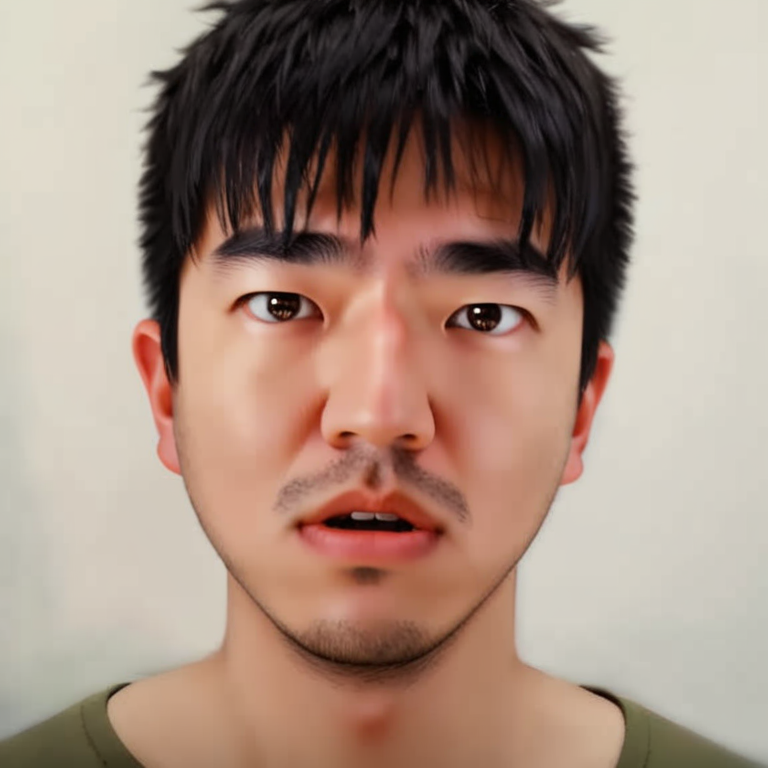

In [143]:
image_grid(images, 1, len(images))

In [164]:
controlnet_landmark_path = "./models/controlnet-14000"
controlnet_landmark = ControlNetModel.from_pretrained(controlnet_landmark_path, torch_dtype=dtype)

In [165]:
from diffusers import StableDiffusionXLControlNetImg2ImgPipeline

In [166]:
pipe = StableDiffusionXLControlNetImg2ImgPipeline.from_pretrained(
            pretrained_model_name_or_path,
            controlnet=controlnet_landmark,
            torch_dtype=dtype,
        ).to(device)

The config attributes {'controlnet_list': ['controlnet', 'RPMultiControlNetModel']} were passed to StableDiffusionXLControlNetImg2ImgPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'controlnet_list': ['controlnet', 'RPMultiControlNetModel']} are not expected by StableDiffusionXLControlNetImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [167]:
images = pipe(
            prompt=[prompt]*4,
            negative_prompt=[negative_prompt]*4,
            image = image0,
            control_image=cond_image,
            controlnet_conditioning_scale=float(identitynet_strength_ratio),
            num_inference_steps=num_steps,
            guidance_scale=guidance_scale,
            height=height,
            width=width,
            generator=generator
        ).images

  0%|          | 0/24 [00:00<?, ?it/s]

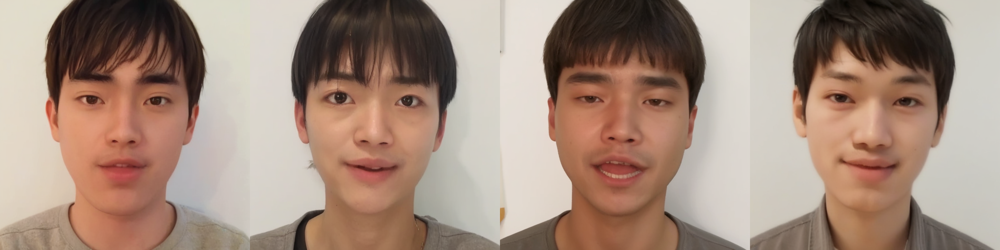

In [168]:
image_grid(images, 1, len(images))

In [169]:
images = pipe(
            prompt=[option.prompt_for_face+",man"]*4,
            negative_prompt=[option.negative_prompt_for_face]*4,
            image = image0,
            control_image=cond_image,
            controlnet_conditioning_scale=float(identitynet_strength_ratio),
            num_inference_steps=num_steps,
            guidance_scale=guidance_scale,
            height=height,
            width=width,
            generator=generator
        ).images

  0%|          | 0/24 [00:00<?, ?it/s]

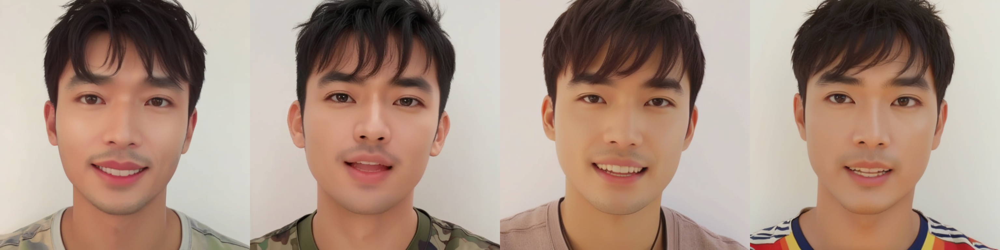

In [170]:
image_grid(images, 1, len(images))

In [171]:
images[0].size

(768, 768)

In [172]:
face_image2 = images[0]
face_image = resize_img_instantid(face_image2)
print(face_image.size, type(face_image))
face_image_cv2 = convert_from_image_to_cv2(face_image)
height, width, _ = face_image_cv2.shape
height, width = 768, 768
# Extract face features
face_info = app.get(face_image_cv2)
print(face_info)
assert len(face_info) > 0, "no face in image"
face_info = sorted(face_info, key=lambda x:(x['bbox'][2]-x['bbox'][0])*(x['bbox'][3]-x['bbox'][1]))[-1]  # only use the maximum face
# face_emb = face_info['embedding']
face_kps = draw_kps(convert_from_cv2_to_image(face_image_cv2), face_info['kps'])
enhance_face_region = True
if enhance_face_region:
    control_mask = np.zeros([height, width, 3])
    x1, y1, x2, y2 = face_info["bbox"]
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    control_mask[y1:y2, x1:x2] = 255
    control_mask = Image.fromarray(control_mask.astype(np.uint8))

(1280, 1280) <class 'PIL.Image.Image'>
[{'bbox': array([ 291.20093,  160.35263,  957.5161 , 1084.554  ], dtype=float32), 'kps': array([[468.04224, 498.36853],
       [807.4548 , 513.30023],
       [636.1965 , 700.4774 ],
       [469.8341 , 837.9285 ],
       [761.2668 , 853.7188 ]], dtype=float32), 'det_score': 0.47180942, 'landmark_3d_68': array([[ 2.68736023e+02,  4.99290039e+02,  4.61327271e+02],
       [ 2.81416718e+02,  6.00964294e+02,  4.50864105e+02],
       [ 2.92202972e+02,  7.03641052e+02,  4.33306946e+02],
       [ 3.08643127e+02,  7.98821350e+02,  3.99026337e+02],
       [ 3.36459106e+02,  8.82094421e+02,  3.25613495e+02],
       [ 3.79667603e+02,  9.44838440e+02,  2.61374176e+02],
       [ 4.31276031e+02,  9.94905457e+02,  2.05950790e+02],
       [ 4.96025696e+02,  1.04157971e+03,  1.39481201e+02],
       [ 5.97853149e+02,  1.08221252e+03,  1.10920723e+02],
       [ 7.02780457e+02,  1.05717786e+03,  1.49286713e+02],
       [ 7.79937561e+02,  1.00887213e+03,  2.27645935e+02

In [173]:
pipe = StableDiffusionXLInstantIDImg2ImgPipeline.from_pretrained(
            pretrained_model_name_or_path,
            controlnet=controlnet,
            torch_dtype=dtype,
            safety_checker=None,
            feature_extractor=None,
        ).to(device)
pipe.load_ip_adapter_instantid(face_adapter)
# load and disable LCM
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl")
pipe.disable_lora()


The config attributes {'controlnet_list': ['controlnet', 'RPMultiControlNetModel']} were passed to StableDiffusionXLInstantIDImg2ImgPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'controlnet_list': ['controlnet', 'RPMultiControlNetModel'], 'safety_checker': None} are not expected by StableDiffusionXLInstantIDImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [174]:
images = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            image = image0,
            image_embeds=face_emb,
            control_image=face_kps,
            control_mask=control_mask,
            controlnet_conditioning_scale=float(identitynet_strength_ratio),
            num_inference_steps=num_steps,
            guidance_scale=guidance_scale,
            height=height,
            width=width,
            generator=generator,
    num_images_per_prompt=1
        ).images

  0%|          | 0/24 [00:00<?, ?it/s]

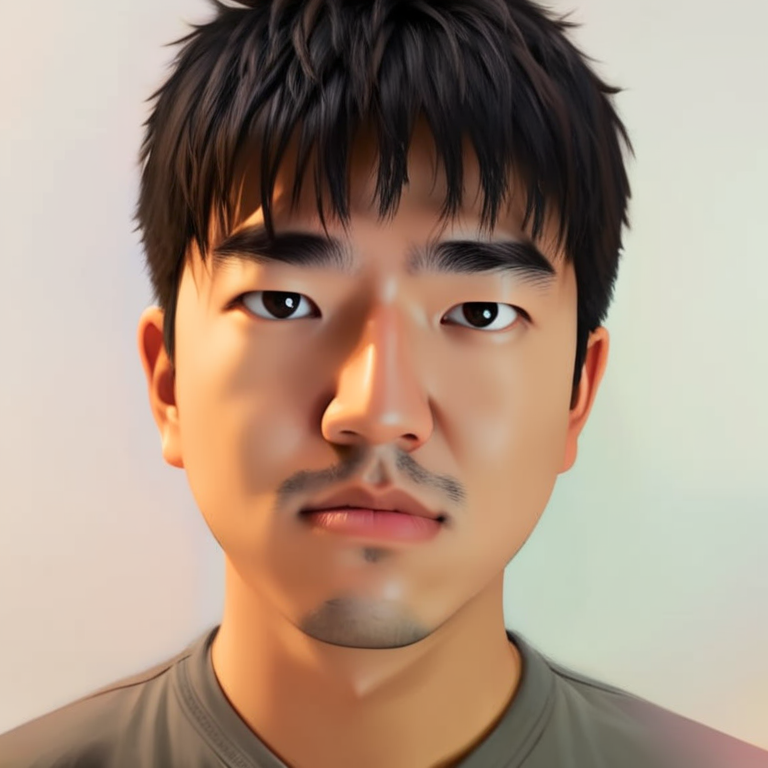

In [175]:
image_grid(images, 1, len(images))

### Multi-Controlnet (InstantID + landmark)

In [176]:
controlnet_landmark_path = "./models/controlnet-34000"

In [177]:
controlnet_landmark = ControlNetModel.from_pretrained(controlnet_landmark_path, torch_dtype=dtype).to(device)

In [178]:
from diffusers.pipelines.controlnet.multicontrolnet import MultiControlNetModel
pipe = StableDiffusionXLInstantIDImg2ImgPipeline.from_pretrained(
            pretrained_model_name_or_path,
            controlnet=MultiControlNetModel(
                [controlnet]
                + [controlnet_landmark]
            ),
            torch_dtype=dtype,
            safety_checker=None,
            feature_extractor=None,
        ).to(device)
pipe.load_ip_adapter_instantid(face_adapter)
# load and disable LCM
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl")
pipe.disable_lora()

The config attributes {'controlnet_list': ['controlnet', 'RPMultiControlNetModel']} were passed to StableDiffusionXLInstantIDImg2ImgPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'controlnet_list': ['controlnet', 'RPMultiControlNetModel'], 'safety_checker': None} are not expected by StableDiffusionXLInstantIDImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [179]:
control_scales = [float(identitynet_strength_ratio)] + [float(identitynet_strength_ratio)]
control_images = [face_kps] + [cond_image]

In [180]:
images = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            image = image0,
            image_embeds=face_emb,
            control_image=control_images,
            control_mask=control_mask,
            controlnet_conditioning_scale=control_scales,
            num_inference_steps=num_steps,
            guidance_scale=guidance_scale,
            height=height,
            width=width,
            generator=generator,
            num_images_per_prompt=1,
        ).images

  0%|          | 0/24 [00:00<?, ?it/s]

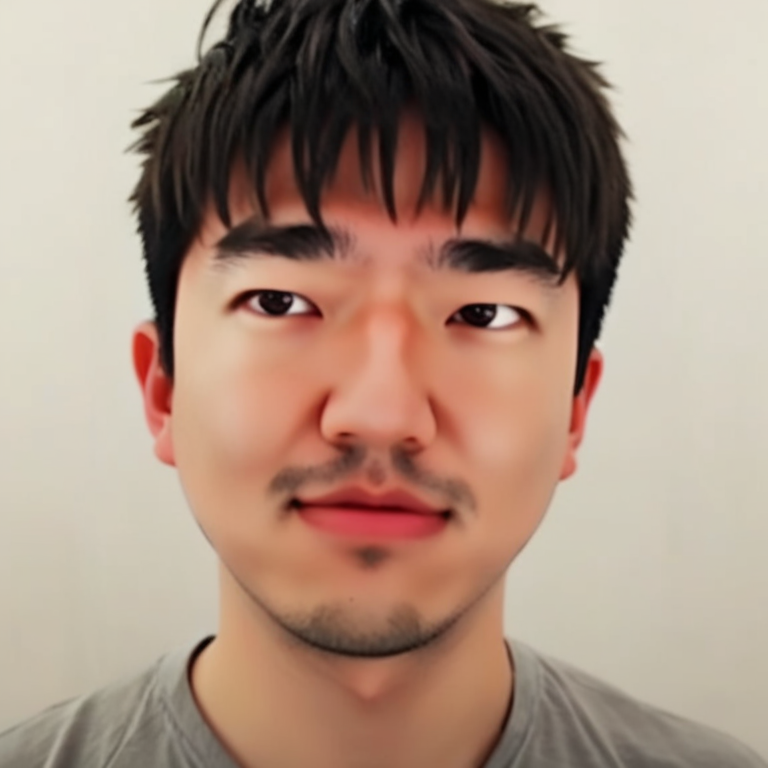

In [181]:
image_grid(images, 1, len(images))

### Drop InstantID ControlNet but keep other parts

In [365]:
from diffusers.pipelines.controlnet.multicontrolnet import MultiControlNetModel
pipe = StableDiffusionXLInstantIDImg2ImgPipeline.from_pretrained(
            pretrained_model_name_or_path,
            controlnet=controlnet_landmark,
            torch_dtype=dtype,
            safety_checker=None,
            feature_extractor=None,
        ).to(device)
pipe.load_ip_adapter_instantid(face_adapter)
# load and disable LCM
pipe.load_lora_weights("latent-consistency/lcm-lora-sdxl")
pipe.disable_lora()

The config attributes {'controlnet_list': ['controlnet', 'RPMultiControlNetModel']} were passed to StableDiffusionXLInstantIDImg2ImgPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'controlnet_list': ['controlnet', 'RPMultiControlNetModel'], 'safety_checker': None} are not expected by StableDiffusionXLInstantIDImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [367]:
images = pipe(
            prompt=option.prompt_for_face,
            negative_prompt=option.negative_prompt_for_face,
            image = image0,
            image_embeds=face_emb,
            control_image=cond_image,
            control_mask=control_mask,
            controlnet_conditioning_scale=float(identitynet_strength_ratio),
            num_inference_steps=num_steps,
            guidance_scale=guidance_scale,
            height=height,
            width=width,
            generator=generator,
        ).images

  0%|          | 0/24 [00:00<?, ?it/s]

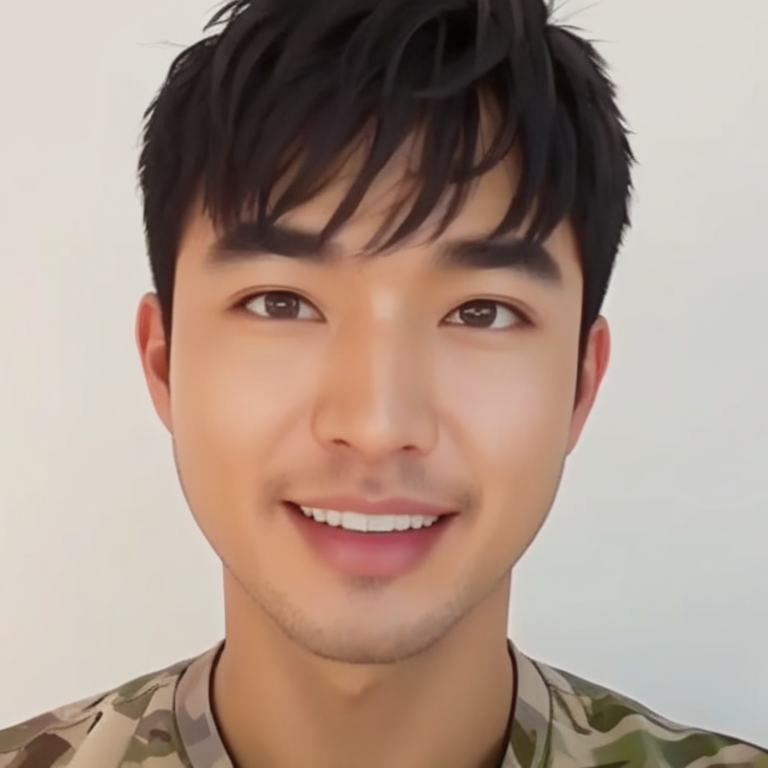

In [368]:
image_grid(images, 1, len(images))

## Step 4

In [52]:
from typing import List, Tuple

import cv2
import numpy as np
import torch
from face_editor.inferencers.vignette_mask_generator import VignetteMaskGenerator
from face_editor.use_cases.mask_generator import MaskGenerator
from facexlib.parsing import init_parsing_model
from facexlib.utils.misc import img2tensor
from torchvision.transforms.functional import normalize


class BiSeNetMaskGenerator(MaskGenerator):
    def __init__(self) -> None:
        self.mask_model = init_parsing_model(device=device)
        self.fallback_mask_generator = VignetteMaskGenerator()

    def name(self):
        return "BiSeNet"

    def generate_mask(
        self,
        face_image: np.ndarray,
        face_area_on_image: Tuple[int, int, int, int],
        affected_areas: List[str],
        mask_size: int,
        use_minimal_area: bool,
        fallback_ratio: float = 0.25,
        **kwargs,
    ) -> np.ndarray:
        original_face_image = face_image
        face_image = face_image.copy()
        face_image = face_image[:, :, ::-1]

        if use_minimal_area:
            face_image = MaskGenerator.mask_non_face_areas(face_image, face_area_on_image)

        h, w, _ = face_image.shape

        if w != 512 or h != 512:
            rw = (int(w * (512 / w)) // 8) * 8
            rh = (int(h * (512 / h)) // 8) * 8
            face_image = cv2.resize(face_image, dsize=(rw, rh))

        face_tensor = img2tensor(face_image.astype("float32") / 255.0, float32=True)
        normalize(face_tensor, (0.5, 0.5, 0.5), (0.5, 0.5, 0.5), inplace=True)
        face_tensor = torch.unsqueeze(face_tensor, 0).to(device)

        with torch.no_grad():
            face = self.mask_model(face_tensor)[0]
        face = face.squeeze(0).cpu().numpy().argmax(0)
        face = face.copy().astype(np.uint8)

        mask = self.__to_mask(face, affected_areas)
        if mask_size > 0:
            mask = cv2.dilate(mask, np.ones((5, 5), np.uint8), iterations=mask_size)

        if w != 512 or h != 512:
            mask = cv2.resize(mask, dsize=(w, h))

        if MaskGenerator.calculate_mask_coverage(mask) < fallback_ratio:
            mask = self.fallback_mask_generator.generate_mask(
                original_face_image, face_area_on_image, use_minimal_area=True
            )

        return mask

    def __to_mask(self, face: np.ndarray, affected_areas: List[str]) -> np.ndarray:
        keep_face = "Face" in affected_areas
        keep_neck = "Neck" in affected_areas
        keep_hair = "Hair" in affected_areas
        keep_hat = "Hat" in affected_areas

        mask = np.zeros((face.shape[0], face.shape[1], 3), dtype=np.uint8)
        num_of_class = np.max(face)
        for i in range(1, num_of_class + 1):
            index = np.where(face == i)
            if i < 14 and keep_face:
                mask[index[0], index[1], :] = [255, 255, 255]
            elif i == 14 and keep_neck:
                mask[index[0], index[1], :] = [255, 255, 255]
            elif i == 17 and keep_hair:
                mask[index[0], index[1], :] = [255, 255, 255]
            elif i == 18 and keep_hat:
                mask[index[0], index[1], :] = [255, 255, 255]
        return mask


In [53]:
params = dict()
params["mask_size"] = 0
params["use_minimal_area"] = False
params["affected_areas"] = ["Face", "Hair", "Hat"]
params["tag"] = face.face_area.tag
params["fallback_ratio"] = 0.1

In [54]:
angle = face.get_angle()

In [55]:
correct_tilt = correct_tilt_func(option, angle)
correct_tilt

False

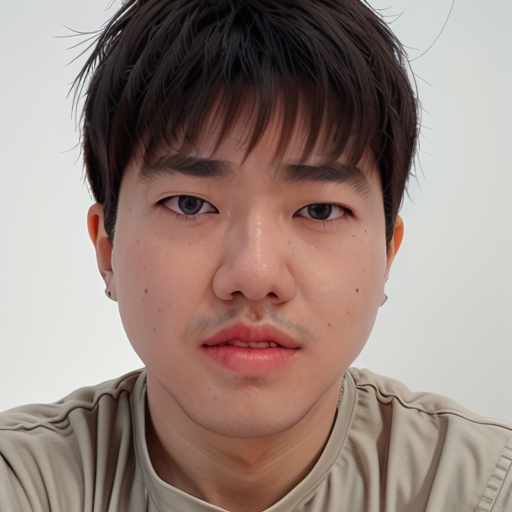

In [56]:
image = rotate_array(edited_face_imagenp, angle) if correct_tilt else edited_face_imagenp
Image.fromarray(image)

In [57]:
face_area_on_image = face.rotate_face_area_on_image(angle) if correct_tilt else face.face_area_on_image
face_area_on_image

(118, 87, 379, 435)

In [58]:
mask_generator = BiSeNetMaskGenerator()
m = mask_generator.generate_mask(edited_face_imagenp, face_area_on_image, **params)

In [59]:
m = rotate_array(m, -angle) if correct_tilt else m

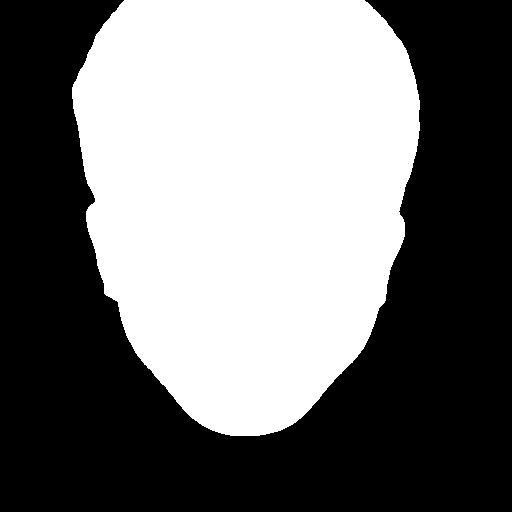

In [60]:
Image.fromarray(m)

In [61]:
edited_face_image_mask = m

In [62]:
edited_face_imagenp = cv2.resize(edited_face_imagenp, dsize=(face.width, face.height), interpolation=cv2.INTER_AREA)
edited_face_imagenp_mask = cv2.resize(edited_face_image_mask, dsize=(face.width, face.height), interpolation=cv2.INTER_AREA)

## Step 5

In [63]:
if option.apply_inside_mask_only:
    face_background = imagenp[
                        face.top : face.bottom,
                        face.left : face.right,
                    ]
    edited_face_fg = (edited_face_imagenp * (edited_face_imagenp_mask / 255.0)).astype("uint8")
    edited_face_bg = (face_background * (1 - (edited_face_imagenp_mask / 255.0))).astype("uint8")
    edited_face_imagenp = edited_face_fg + edited_face_bg

In [64]:
edited_imagenp = imagenp.copy()
edited_imagenp[
                face.top : face.bottom,
                face.left : face.right,
            ] = edited_face_imagenp
edited_imagenp_mask = np.zeros_like(edited_imagenp)
edited_imagenp_mask[
                face.top : face.bottom,
                face.left : face.right,
            ] = edited_face_imagenp_mask

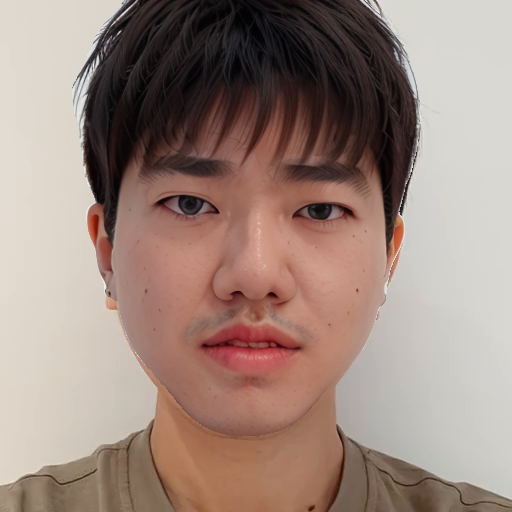

In [65]:
simple_composite_image = Image.fromarray(edited_imagenp)
simple_composite_image

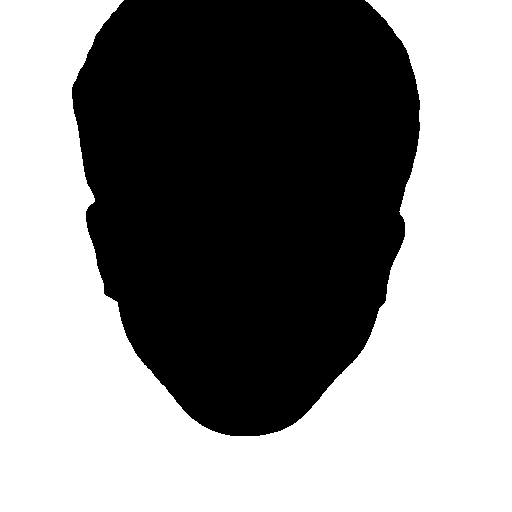

In [66]:
mask_image = Image.fromarray(255-edited_imagenp_mask)
mask_image

## Step 5.1 Repaint the background

In [67]:
guidance_scale = 5
do_classifier_free_guidance = guidance_scale > 1.0
strength = 0.1
num_inference_steps = 50
batch_size = 2 if do_classifier_free_guidance else 1

prompt = "hyperdetailed, masterpiece, top quality, best quality, official art, beautiful and aesthetic, colorful,highest detailed"
negative_prompt = "bad_pictures,disfigured,lowres,cross-eyed,missing fingers,fused fingers,too many fingers,poorly drawn hands,malformed limbs,missing limb,mutated hands,ugly,long body,bad body,mutated,deformed,disconnected limbs,malformed hands,extra legs,bad feet,mutated hands and fingers,bad hands,extra limb,extra arms,floating limbs,poorly drawn face,skin blemishes,skin spots,mutation,long neck,mole,scar"

In [68]:
#hide
# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained(f"{vae_model_path}")

# Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained(f"{base_model_path}", subfolder="unet")

# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)
# scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.12.mlp.fc1.bias', 'vision_model.encoder.layers.13.self_attn.out_proj.bias', 'vision_model.encoder.layers.20.self_attn.v_proj.weight', 'vision_model.encoder.layers.7.layer_norm1.bias', 'vision_model.encoder.layers.2.mlp.fc1.weight', 'text_projection.weight', 'vision_model.encoder.layers.10.mlp.fc2.bias', 'vision_model.encoder.layers.22.self_attn.q_proj.weight', 'vision_model.encoder.layers.3.self_attn.out_proj.weight', 'vision_model.encoder.layers.6.mlp.fc2.weight', 'vision_model.encoder.layers.11.self_attn.out_proj.weight', 'vision_model.encoder.layers.11.self_attn.q_proj.bias', 'vision_model.encoder.layers.13.layer_norm2.weight', 'vision_model.encoder.layers.2.layer_norm1.bias', 'vision_model.encoder.layers.9.self_attn.out_proj.weight', 'vision_model.encoder.layers.21.mlp.fc2.weight', 'vision_model.encoder.layers.0.self_attn.q_proj.weight',

In [69]:
#hide
# To the GPU we go!
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device);

In [70]:
init_image = simple_composite_image

In [71]:
def create_binary_mask(image, round=True):
    if image.mode == 'RGBA' and image.getextrema()[-1] != (255, 255):
        if round:
            image = image.split()[-1].convert("L").point(lambda x: 255 if x > 128 else 0)
        else:
            image = image.split()[-1].convert("L")
    else:
        image = image.convert('L')
    return image

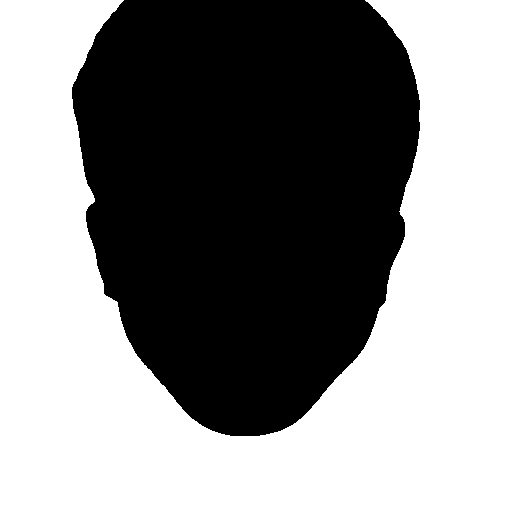

In [72]:
binary_mask = create_binary_mask(mask_image)
image_mask = binary_mask
binary_mask

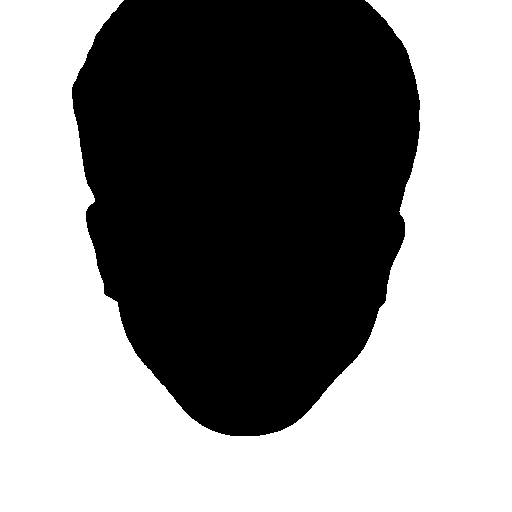

In [73]:
width, height = init_image.size
image_mask = resize_image(1, image_mask, width, height)
np_mask = np.array(image_mask)
np_mask = np.clip((np_mask.astype(np.float32)) * 2, 0, 255).astype(np.uint8)
mask_for_overlay = Image.fromarray(np_mask)
mask_for_overlay

In [74]:
overlay_images = []
latent_mask = image_mask

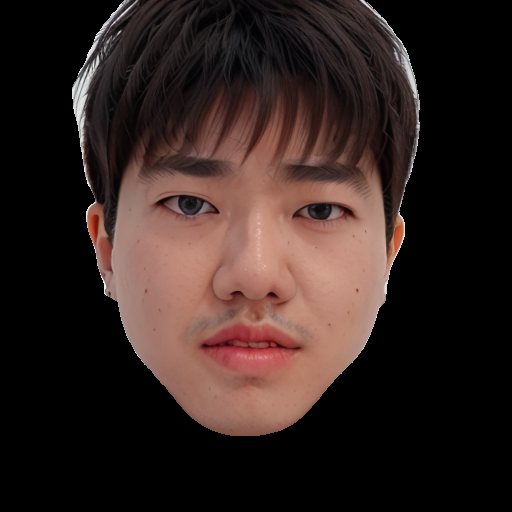

In [75]:
image_masked = Image.new('RGBa', (init_image.width, init_image.height))
image_masked.paste(init_image.convert("RGBA").convert("RGBa"), mask=ImageOps.invert(mask_for_overlay.convert('L')))
image_masked.show()

In [76]:
overlay_images.append(image_masked.convert('RGBA'))

In [77]:
init_image1 = np.array(init_image).astype(np.float32) / 255.0
init_image1 = np.moveaxis(init_image1, 2, 0)

In [78]:
batch_images = np.expand_dims(init_image1, axis=0).repeat(batch_size, axis=0)
init_image1 = torch.from_numpy(batch_images)
init_image1 = init_image1.to(device, dtype=torch.float16)
init_image1.shape

torch.Size([2, 3, 512, 512])

In [79]:
# from diffedit
generator = torch.cuda.manual_seed(seed)
def preprocess(image):
    w, h = image.size
    w, h = map(lambda x: x - x % 32, (w, h))  # resize to integer multiple of 32
    image = image.resize((w, h), resample=PIL.Image.Resampling.LANCZOS)
    image = np.array(image).astype(np.float32) / 255.0
    image = image[None].transpose(0, 3, 1, 2)
    image = torch.from_numpy(image)
    return 2.0 * image - 1.0
def encode_image(init_image, latents_dtype, device, need_preprocess=True):
    # encode the init image into latents and scale the latents
    if need_preprocess:
        init_image = preprocess(init_image)
    init_image = init_image.to(device=device, dtype=latents_dtype)
    with torch.no_grad(): init_latent_dist = vae.encode(init_image).latent_dist
    init_latents = init_latent_dist.sample(generator=generator)
    init_latents = 0.18215 * init_latents #
    return init_latents

In [80]:
init_latent = encode_image(init_image, torch.float, device)
init_latent.shape

torch.Size([1, 4, 64, 64])

In [81]:
init_mask = latent_mask
latmask = init_mask.convert('RGB').resize((init_latent.shape[3], init_latent.shape[2]))
latmask = np.moveaxis(np.array(latmask, dtype=np.float32), 2, 0) / 255
latmask = latmask[0]
# if self.mask_round:
#     latmask = np.around(latmask)
latmask = np.tile(latmask[None], (4, 1, 1))

mask0 = torch.asarray(1.0 - latmask).to(device).type(torch.float16)
nmask0 = torch.asarray(latmask).to(device).type(torch.float16)

In [82]:
def inpainting_image_conditioning(source_image, latent_image, image_mask=None, round_image_mask=True):
    # self.is_using_inpainting_conditioning = True

    # Handle the different mask inputs
    if image_mask is not None:
        if torch.is_tensor(image_mask):
            conditioning_mask = image_mask
        else:
            conditioning_mask = np.array(image_mask.convert("L"))
            conditioning_mask = conditioning_mask.astype(np.float32) / 255.0
            conditioning_mask = torch.from_numpy(conditioning_mask[None, None])

            if round_image_mask:
                # Caller is requesting a discretized mask as input, so we round to either 1.0 or 0.0
                conditioning_mask = torch.round(conditioning_mask)

    else:
        conditioning_mask = source_image.new_ones(1, 1, *source_image.shape[-2:])

    # Create another latent image, this time with a masked version of the original input.
    # Smoothly interpolate between the masked and unmasked latent conditioning image using a parameter.
    conditioning_mask = conditioning_mask.to(device=source_image.device, dtype=source_image.dtype)
    conditioning_image = torch.lerp(
        source_image,
        source_image * (1.0 - conditioning_mask),
        # getattr(self, "inpainting_mask_weight", shared.opts.inpainting_mask_weight)
        0.5,
    )

    print(source_image.shape)
    print(conditioning_image.shape)

    # Encode the new masked image using first stage of network.
    # conditioning_image = self.sd_model.get_first_stage_encoding(self.sd_model.encode_first_stage(conditioning_image))
    conditioning_image = encode_image(conditioning_image, torch.float, device, need_preprocess=False)
    

    # Create the concatenated conditioning tensor to be fed to `c_concat`
    conditioning_mask = torch.nn.functional.interpolate(conditioning_mask, size=latent_image.shape[-2:])
    conditioning_mask = conditioning_mask.expand(conditioning_image.shape[0], -1, -1, -1)
    image_conditioning = torch.cat([conditioning_mask, conditioning_image], dim=1)
    image_conditioning = image_conditioning.to(device).type(torch.float16)

    return image_conditioning

In [83]:
image_conditioning = inpainting_image_conditioning(init_image1 * 2 - 1, init_latent, image_mask, round_image_mask=False)
image_conditioning.shape

torch.Size([2, 3, 512, 512])
torch.Size([2, 3, 512, 512])


torch.Size([2, 5, 64, 64])

In [84]:
def get_timestamps(scheduler, num_inference_steps, strength, device):
    scheduler.set_timesteps(num_inference_steps)

    # get the original timestep using init_timestep
    offset = scheduler.config.get("steps_offset", 0)
    init_timestep = int(num_inference_steps * strength) + offset
    init_timestep = min(init_timestep, num_inference_steps)

    timesteps = scheduler.timesteps[-init_timestep]
    timesteps = torch.tensor([timesteps], device=device)
    t_start = max(num_inference_steps - init_timestep + offset, 0)
    return timesteps, t_start

In [85]:

scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)
timesteps, t_start = get_timestamps(scheduler, num_inference_steps, strength, device)

In [86]:
# add noise to latents using the timesteps
noise = torch.randn(init_latent.shape, generator=generator, device=device, dtype=torch.float16)
noisy_latents = scheduler.add_noise(init_latent, noise, timesteps)
latents = noisy_latents

In [87]:
timesteps = scheduler.timesteps[t_start:].to(device)
noise_preds = torch.tensor([], device='cuda')

In [88]:
def get_text_embeddings(prompt, negative_prompt, tokenizer, text_encoder, do_classifier_free_guidance, device): #outputs text_embeddings
    # get prompt text embeddings
    text_inputs = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, 
                            return_tensors="pt", truncation=True)
    text_input_ids = text_inputs.input_ids
    text_embeddings = text_encoder(text_input_ids.to(device))[0]
    # text_embeddings = text_embeddings.repeat_interleave(num_images_per_prompt, dim=0)
    
    if negative_prompt is None:
        uncond_tokens = [""]
    else:
        uncond_tokens = negative_prompt
    max_length = text_input_ids.shape[-1]
    uncond_input = tokenizer(uncond_tokens, padding="max_length", max_length=max_length, 
                             return_tensors="pt", truncation=True)
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]

    # duplicate unconditional embeddings for each generation per prompt
    # uncond_embeddings = uncond_embeddings.repeat_interleave(batch_size * num_images_per_prompt, dim=0)
    
    # For classifier free guidance, we need to do two forward passes.
    # Here we concatenate the unconditional and text embeddings into a single batch
    # to avoid doing two forward passes
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])
    return text_embeddings

In [89]:
text_embeddings = get_text_embeddings(prompt, negative_prompt, tokenizer, text_encoder, do_classifier_free_guidance, device)
for i, t in enumerate(timesteps):
    # expand the latents if we are doing classifier free guidance
    latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
    latent_model_input = scheduler.scale_model_input(latent_model_input, t)

    # print(latent_model_input.shape, image_conditioning.shape)
    
    # latent_model_input = torch.cat([latent_model_input, image_conditioning], dim=1)
    
    # predict the noise residual
    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    if do_classifier_free_guidance:
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
        
    noise_preds = torch.concat((noise_preds, noise_pred)) #This performs much worse when outside the for-loop
    # compute the previous noisy sample x_t -> x_t-1
    latent_step = scheduler.step(noise_pred, t, latents)
    latents = latent_step.prev_sample 
    if mask0 is not None: 
        # latents = mask*latents+(1-mask)*init_latent
        latents = latents*nmask0 + init_latent*mask0

In [90]:
latents = 1 / 0.18215 * latents
with torch.no_grad(): image = vae.decode(latents).sample

In [91]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]

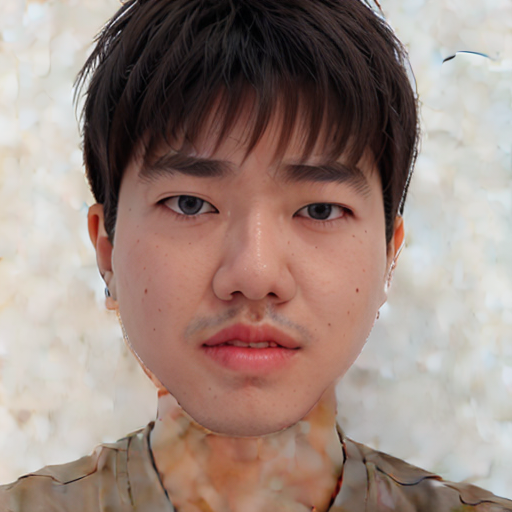

In [92]:
image_grid(pil_images, 1, len(pil_images))